> ### EEE4423: Deep Learning Lab

# LAB \#10: Image Style Transfer

<h4><div style="text-align: right"> Due date: May 13, 2022  </div> <br>
<div style="text-align: right"> Please upload your file @ LearnUs by 9 AM in the form of [ID_Name_Lab10.ipynb]. </div></h4>

### *Instructions:*
- Write a program implementing a particular algorithm to solve a given problem.   
- <span style="color:red">**Report and discuss your results. Analyze the algorithm, theoretically and empirically.**</span> 
- Each team must write their own answers and codes (<span style="color:red">**if not you will get a F grade**</span>).

<h2><span style="color:blue">[2018142102] [Euijin Hong]</span> </h2>

In [1]:
import datetime
print("This code is written at " + str(datetime.datetime.now()))

This code is written at 2023-05-07 16:33:49.090960




# Neural Stylization with Pytorch
## Introduction


<img src="http://drive.google.com/uc?export=view&id=1crqAv5aoJ3uMSDFT99l6VuzY3VUlF_C7" alt="no_image" style="width: 900px;"/>

This lab introduces a Neural Algorithm of Artistic Style that can separate and recombine the image content and style of natural images. The algorithm takes two images, a content-image, and a style-image, and generates the optimized image to resemble the content of the content-image and the artistic style of the style-image.


**Main idea**

To transfer the style image $\textit{I}_s$ onto a content image $\textit{I}_c$ we synthesize a new image that simultaneously matches the content representation of $\textit{I}_c$ and the style representation of $\textit{I}_s$ (Fig). Thus we jointly minimize the distance of the feature representations of a white noise image from the content representation of the photograph in one layer and the style representation of the painting defined on a number of layers of the Convolutional Neural Network.
<img src="http://drive.google.com/uc?export=view&id=1BhfqqQEMn3AyHpc6fB-shQDlU-tQeoLz" alt="no_image" style="width: 900px;"/>

In [2]:
import warnings

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

from PIL import Image
import numpy as np

from torchvision import datasets
from torch.utils.data import DataLoader

warnings.filterwarnings("ignore")

**Style and content image**

In [3]:
style_img_name = './dataset-dllab/lab10/style/mosaic.jpg'
content_img_name = './dataset-dllab/lab10/content/Tuebingen_Neckarfront.jpg'

In [4]:
style_img = Image.open(style_img_name)
content_img = Image.open(content_img_name)

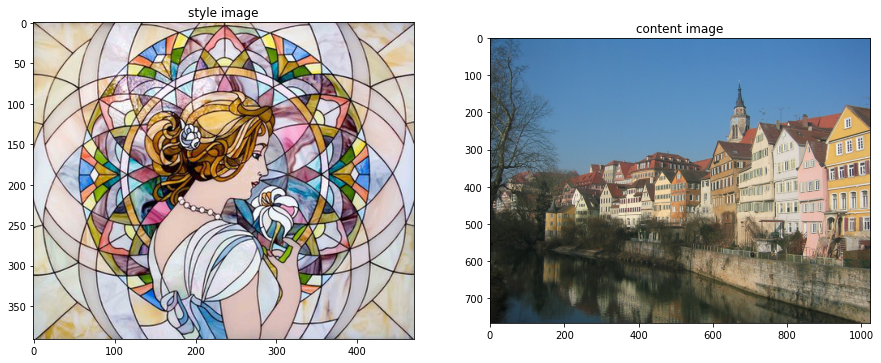

In [5]:
plt.figure(figsize = (15,15))
plt.subplot(1,2,1)
plt.title('style image')
plt.imshow(style_img)
plt.subplot(1,2,2)
plt.title('content image')
plt.imshow(content_img)

### Style representation

To obtain a representation of the style of an input image, we use a feature space designed to capture texture information. This feature space can be built on top of the filter responses in any layer of the network. It consists of the correlations between the different filter responses, where the expectation is taken over the spatial extent of the feature maps. These feature correlations are given by the Gram matrix $\mathit{G} \in \mathcal{R}^{\mathit{N_l}  \times  \mathit{N_l}}$, where $\mathit{G^l_{ij}}$ is the inner product between the vectorised feature maps $i$ and $j$ in layer $l$:

### <center> ${\mathit{G^l_{ij}} = \sum_{k}{F^l_{ik}F^l_{jk}}}$ </center>

In [6]:
def gram_matrix(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) / (ch * h * w)
    return gram

### Deep image representations

In this work we show how the generic feature representations learned by high-performing Convolutional Neural Networks can be used to independently process and manipulate the content and the style of natural images.

The image reperesentations were generated on the basis of the VGG network, which was trained to perform object recognition and localization. We use the feature space provided by the 16 convolutional and 5 pooling layers of the 19-layer VGG network.

In [7]:
import torchvision.models.vgg as vgg

class LossNetwork(torch.nn.Module):
    def __init__(self):
        super(LossNetwork, self).__init__()
        # get vgg network
        self.vgg = vgg.vgg19(pretrained=False)


    def forward(self, x, layer_name):
        output = {}
        for name, module in self.vgg.features._modules.items():
            x = module(x)
            if name in layer_name:
                output[layer_name[name]] = x
        return output

In [8]:
loss_net = LossNetwork().cuda()
checkpoint = torch.load('./pretrain/lab10/vgg19.pth')
loss_net.vgg.load_state_dict(checkpoint)
for param in loss_net.parameters():
    param.requires_grad = False

Content representation is on layer ‘conv4 2’ and the style representation is on layers ‘conv1 1’, ‘conv2 1’, ‘conv3 1’, ‘conv4 1’ and ‘conv5 1’

In [9]:
style_layer_name = {
    '1': "conv1-1",
    '6': "conv2-1",
    '11': "conv3-1",
    '20': "conv4-1",
    '29': "conv5-1"
}

content_layer_name = {
    '22': "conv4-2"
}

**Pre and post processing for images**

In [10]:

img_size = 512 
prep = transforms.Compose([transforms.Resize(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], #subtract imagenet mean
                        std=[1,1,1]),
])

post = transforms.Compose([
    transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], #add imagenet mean
                        std=[1,1,1]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

In [11]:
content = prep(content_img).cuda().unsqueeze(0)
style = prep(style_img).cuda().unsqueeze(0)

out_img = content.clone()
out_img.requires_grad = True


criterion = nn.MSELoss()
style_gt = [gram_matrix(f).detach() for f in loss_net(style, style_layer_name).values()]
content_gt = [A.detach() for A in loss_net(content, content_layer_name).values()]

show_iter = 50
optimizer = optim.LBFGS([out_img])
n_iter = [0]

**Hyper parameters**

In [12]:
alpha = 1e0
beta = 1e7
max_iter = 500

**Optimizing image**

In [13]:
while n_iter[0] <= max_iter:

    def closure():
        optimizer.zero_grad()
        
        style_layers = [gram_matrix(f) for f in loss_net(out_img, style_layer_name).values()]
        content_layers = [f for f in loss_net(out_img, content_layer_name).values()]
        
        style_loss = 0
        for i in range(len(style_layers)):    
            style_loss += criterion(style_layers[i], style_gt[i])
        
        content_loss = criterion(content_layers[0], content_gt[0])
        
        loss = alpha * content_loss + beta * style_loss
        loss.backward()
        n_iter[0]+=1
        #print loss
        if n_iter[0]%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.item()))

        return loss

    optimizer.step(closure)
    
#display result

Iteration: 50, loss: 9.191671
Iteration: 100, loss: 6.487057
Iteration: 150, loss: 5.744811
Iteration: 200, loss: 5.375827
Iteration: 250, loss: 5.168764
Iteration: 300, loss: 5.034980
Iteration: 350, loss: 4.944547
Iteration: 400, loss: 4.877645
Iteration: 450, loss: 4.826876
Iteration: 500, loss: 4.786427


**Visualize result images**

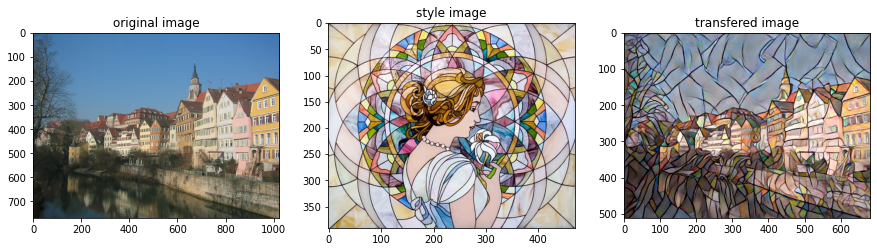

In [14]:
out_img_hr = post(out_img.data[0].cpu().squeeze())

plt.figure(figsize = (15,15))

plt.subplot(1,3,1)
plt.title('original image')
plt.imshow(content_img)
plt.subplot(1,3,2)
plt.title('style image')
plt.imshow(style_img)
plt.subplot(1,3,3)
plt.title('transfered image')
plt.imshow(out_img_hr)
plt.show()



# Perceptual Losses for Style Transfer with Pytorch


**Main idea**

Previous method produces high-quality results, but is computationally expensive since each step of the optimization problem requires a forward and backward pass through the pretrained network. To overcome this computational burden, we train a feed-forward network to quickly approximate solutions to their optimization problem.
<img src="http://drive.google.com/uc?export=view&id=1GFM9l-63SsOFYHP-g2WNN2T6zNDdD09Z" alt="no_image" style="width: 900px;"/>

$\mathcal{L}_{total} = \alpha\sum_{}{\mathcal{l}_{content}} + \beta\sum_{}{\mathcal{l}_{style}} + \gamma\mathcal{l}_{TV}$

- $\mathcal{l}_{content}^{\phi,j} = ||\phi_j(\hat{y}) - \phi_j(y)||^2_2$, $\phi$ represents vgg feature

- $\mathcal{l}_{style}^{\phi,j} = ||G^{\phi}_{j}(\hat{y}) - G^{\phi}_{j}(y)||^2_F$, $G$ represents gram matrix.

- $\mathcal{l}_{TV}(y) = \sum_{i,j}{|y_{i+1,j}-y_{i,j}|+|y_{i,j+1}-y_{i,j}|}$



**Data loader**

In [13]:
data_root = './dataset-dllab/lab10/train'
image_size = 224
transform = transforms.Compose([
    transforms.Resize(image_size), 
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder(data_root, transform)

batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

### 1.1 Write code (Image Transform Net) [3 points]

<img src="http://drive.google.com/uc?export=view&id=1OQzOwfRgpncvvBCwUCJbShYQGBElUqjW" alt="no_image" style="width: 400px;"/>

##### Residual block (channel, x)
- Conv 1: $3\times3$ Conv(in: channel, out: channel, padding: 1) with reflection padding
- Instance Norm
- Relu
- Conv 2: $3\times3$ Conv(in: channel, out: channel, padding: 1) with reflection padding
- Instance Norm
- Residual Connection

#### ImageTransformNet
- Conv $9\times9$  (in: 3, out: 32, padding: 4) with reflection padding
- Instance Norm
- Relu
- Conv $3\times3$  (in: 32, out: 64, padding: 1, **stride: 2**) with reflection padding
- Instance Norm
- Relu
- Conv $3\times3$  (in: 64, out:128, padding: 1, **stride: 2**) with reflection padding
- Instance Norm
- Relu
- 5 Residual block(channel: 128)
- $2\times$ Nearest Upsample
- Conv $3\times3$  (in: 128, out:64, padding: 1) with reflection padding
- Instance Norm
- Relu
- **$2\times$ Nearest Upsample**
- Conv $3\times3$  (in: 64, out:32, padding: 1) with reflection padding
- Instance Norm
- Relu
- Conv $9\times9$  (in: 32, out:3, padding: 4) with reflection padding



In [25]:
class ImageTransformNet(torch.nn.Module):
    def __init__(self):
        super(ImageTransformNet, self).__init__()
        #############
        # CODE HERE #
        #############
        
        # define residual block with input and output channels of 128
        self.residual_block = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, padding=1, padding_mode='reflect'), 
            nn.InstanceNorm2d(128), 
            nn.ReLU(), 
            nn.Conv2d(128, 128, kernel_size=3, padding=1, padding_mode='reflect'), 
            nn.InstanceNorm2d(128), 
        )
        
        # define a residual shortcut with identity layer
        self.residual_shortcut = nn.Sequential(
            nn.Identity()
        )
        # define convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=9, padding=4, padding_mode='reflect')
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1, stride=2, padding_mode='reflect')
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=2, padding_mode='reflect')
        self.conv4 = nn.Conv2d(128, 64, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv5 = nn.Conv2d(64, 32, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv6 = nn.Conv2d(32, 3, kernel_size=9, padding=4, padding_mode='reflect')
        
        # define instance normalization layers
        self.instance_32 = nn.InstanceNorm2d(32)
        self.instance_64 = nn.InstanceNorm2d(64)
        self.instance_128 = nn.InstanceNorm2d(128)
        
        # define nearest upsampling layer
        self.nearest_upsample_2 = nn.Upsample(scale_factor=2, mode='nearest')
        
        # define activation layer
        self.relu = nn.ReLU()

    def forward(self, X):
        #############
        # CODE HERE #
        #############
        # forwarding the image transform network 
        x = self.conv1(X)
        x = self.instance_32(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.instance_64(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.instance_128(x)
        x = self.relu(x)
        
        x = self.residual_block(x) + x
        x = self.residual_block(x) + x
        x = self.residual_block(x) + x
        x = self.residual_block(x) + x
        x = self.residual_block(x) + x
        
        x = self.nearest_upsample_2(x)
        
        x = self.conv4(x)
        x = self.instance_64(x)
        x = self.relu(x)
        
        x = self.nearest_upsample_2(x)
        
        x = self.conv5(x)
        x = self.instance_32(x)
        x = self.relu(x)
        
        x = self.conv6(x)
        
        return x

In [26]:
transformer = ImageTransformNet().cuda()
transformer_a10 = ImageTransformNet().cuda()
transformer_b4 = ImageTransformNet().cuda()
transformer_b10 = ImageTransformNet().cuda()

### 1.2 Find style and content representation layers in loss net [1 points]

Content representation is on layer ‘conv3 3’ and the style representation is on layers ‘conv1 2’, ‘conv2 2’, ‘conv3 3’, and ‘conv4 3’

In [18]:
vgg.vgg19(pretrained=True).features

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [27]:
style_layer_name = {
    #############
    # CODE HERE #
    #############
    # Extract layers named in the paper
    # layer conv 1-2
    '3': "conv1-2",
    # layer conv 2-2
    '8': "conv2-2",
    # layer conv 3-3
    '15': "conv3-3",
    # layer conv 4-3
    '24': "conv4-3"
}

content_layer_name = {
    #############
    # CODE HERE #
    #############
    # layer conv 3-3
    '15': "conv3-3"
}

In [28]:
# check the style layers extraction
for name, module in vgg.vgg19(pretrained=False).features._modules.items():
    if name in style_layer_name:
        print(name)

3
8
15
24


In [29]:
# Using pretrained VGG19 model
import torchvision.models.vgg as vgg

class LossNetwork(torch.nn.Module):
    def __init__(self):
        super(LossNetwork, self).__init__()
        # get vgg network
        self.vgg = vgg.vgg19(pretrained=False)


    def forward(self, x, layer_name):
        output = {}
        for name, module in self.vgg.features._modules.items():
            x = module(x)
            if name in layer_name:
                output[layer_name[name]] = x
        return output

loss_net = LossNetwork().cuda()
# load the pretrained weights
checkpoint = torch.load('./pretrain/lab10/vgg19.pth')
loss_net.vgg.load_state_dict(checkpoint)
for param in loss_net.parameters():
    param.requires_grad = False

In [30]:
style = transform(style_img).cuda().unsqueeze(0)
style_gt = [gram_matrix(f).detach() for f in loss_net(style, style_layer_name).values()]

**Hyper parameters**

In [23]:
# You may adjust hyper parameters 
alpha = 1e0
beta = 1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer = optim.Adam(transformer.parameters(), LR)
criterion = nn.MSELoss() # use mean squared error loss as a criterion function

### 1.3 Train the image transformNet [4 points]

- Print total loss, content loss, style loss and total variation loss for every 50 iterations
- Style loss should contain all of the layers listed above
- Use alpha, beta, gamma as coefficient

### alpha = 1e0, beta = 1e4, gamma = 1e-5

In [24]:
transformer.train()
n_iter = 0

total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0

class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:
            #############
            # CODE HERE #
            #############
            # clear the optimizer gradients to zero
            optimizer.zero_grad()
            
            # input content image x to gpu
            x = x.cuda()
            
            # obtain content ground truth from the loss net 'conv3-3'
            content_gt = [C.detach() for C in loss_net(x.clone(), content_layer_name).values()]
            
            # forward the transformer network and obtain the output image yhat
            yhat = transformer(x)
            
            # obtain the style and content features of the output image yhat
            style_layers = [gram_matrix(f) for f in loss_net(yhat, style_layer_name).values()]
            content_layers = [f for f in loss_net(yhat, content_layer_name).values()]
            
            # compute the style loss between predicted features and gt in each style layer
            style_loss = 0
            for i in range(len(style_layers)):    
                style_loss += criterion(style_layers[i], style_gt[i])
            # compute the content loss between predicted features and gt in content layer
            content_loss = criterion(content_layers[0], content_gt[0])
            
            # compute total variation loss by shifting the output image and gaining the absolute value of height and width
            tv_h = torch.abs(yhat[:,:,1:,:]-yhat[:,:,:-1,:]).sum()
            tv_w = torch.abs(yhat[:,:,:,1:]-yhat[:,:,:,:-1]).sum()
            tv_loss = (tv_h + tv_w)
            
            # total loss is the weighted sum of content loss, style loss, and total variation loss
            total_loss = alpha * content_loss + beta * style_loss + gamma * tv_loss
            
            # add the current loss to save the average running loss per 50 iterations
            content_running_loss += alpha * content_loss / 50
            style_running_loss += beta * style_loss / 50
            tv_running_loss += gamma * tv_loss / 50
            total_running_loss += total_loss / 50
            
            # backward propagation for learning gradients
            total_loss.backward()
            
            # update the parameters
            optimizer.step()
            
            # increase iteration flag by 1
            n_iter += 1
            
            # for every 50 iteration, show the aggregate running loss
            if n_iter % show_iter == (show_iter-1):
                print(f"Iteration: {n_iter+1}, total loss: {total_running_loss:.2f}, content loss: {content_running_loss:.2f}, style loss: {style_running_loss:.2f}, tv loss: {tv_running_loss:.2f}")
                # reset the average loss to zero
                content_running_loss = 0
                style_running_loss = 0
                tv_running_loss = 0
                total_running_loss = 0
            # stop the iteration when it reaches at iteration number 2000
            if n_iter >= steps:
                raise Found

except Found:
    pass
    

Iteration: 50, total loss: 62.97, content loss: 22.74, style loss: 38.64, tv loss: 1.59
Iteration: 100, total loss: 47.95, content loss: 27.52, style loss: 18.02, tv loss: 2.40
Iteration: 150, total loss: 43.53, content loss: 26.17, style loss: 14.80, tv loss: 2.57
Iteration: 200, total loss: 40.65, content loss: 24.57, style loss: 13.49, tv loss: 2.58
Iteration: 250, total loss: 39.40, content loss: 24.03, style loss: 12.76, tv loss: 2.61
Iteration: 300, total loss: 37.16, content loss: 22.74, style loss: 11.75, tv loss: 2.67
Iteration: 350, total loss: 36.17, content loss: 22.07, style loss: 11.41, tv loss: 2.69
Iteration: 400, total loss: 35.58, content loss: 21.47, style loss: 11.46, tv loss: 2.65
Iteration: 450, total loss: 34.71, content loss: 21.07, style loss: 10.97, tv loss: 2.67
Iteration: 500, total loss: 34.40, content loss: 20.76, style loss: 10.99, tv loss: 2.65
Iteration: 550, total loss: 33.67, content loss: 20.45, style loss: 10.51, tv loss: 2.70
Iteration: 600, total 

### alpha = 1e1, beta = 1e4, gamma = 1e-5

In [31]:
# You may adjust hyper parameters 
alpha = 1e1
beta = 1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer_a10 = optim.Adam(transformer_a10.parameters(), LR)
criterion = nn.MSELoss() # use mean squared error loss as a criterion function

In [32]:
transformer_a10.train()
n_iter = 0

total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0

class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:
            #############
            # CODE HERE #
            #############
            # clear the optimizer gradients to zero
            optimizer_a10.zero_grad()
            
            # input content image x to gpu
            x = x.cuda()

            # obtain content ground truth from the loss net 'conv3-3'
            content_gt = [C.detach() for C in loss_net(x.clone(), content_layer_name).values()]
            
            # forward the transformer network and obtain the output image yhat
            yhat = transformer_a10(x)
            
            # obtain the style and content features of the output image yhat
            style_layers = [gram_matrix(f) for f in loss_net(yhat, style_layer_name).values()]
            content_layers = [f for f in loss_net(yhat, content_layer_name).values()]
            
            # compute the style loss between predicted features and gt in each style layer
            style_loss = 0
            for i in range(len(style_layers)):    
                style_loss += criterion(style_layers[i], style_gt[i])
            # compute the content loss between predicted features and gt in content layer
            content_loss = criterion(content_layers[0], content_gt[0])
            
            # compute total variation loss by shifting the output image and gaining the absolute value of height and width
            tv_h = torch.abs(yhat[:,:,1:,:]-yhat[:,:,:-1,:]).sum()
            tv_w = torch.abs(yhat[:,:,:,1:]-yhat[:,:,:,:-1]).sum()
            tv_loss = (tv_h + tv_w)
            
            # total loss is the weighted sum of content loss, style loss, and total variation loss
            total_loss = alpha * content_loss + beta * style_loss + gamma * tv_loss
            
            # add the current loss to save the average running loss per 50 iterations
            content_running_loss += alpha * content_loss / 50
            style_running_loss += beta * style_loss / 50
            tv_running_loss += gamma * tv_loss / 50
            total_running_loss += total_loss / 50
            
            # backward propagation for learning gradients
            total_loss.backward()
            
            # update the parameters
            optimizer_a10.step()
            
            # increase iteration flag by 1
            n_iter += 1
            
            # for every 50 iteration, show the aggregate running loss
            if n_iter % show_iter == (show_iter-1):
                print(f"Iteration: {n_iter+1}, total loss: {total_running_loss:.2f}, content loss: {content_running_loss:.2f}, style loss: {style_running_loss:.2f}, tv loss: {tv_running_loss:.2f}")
                # reset the average loss to zero
                content_running_loss = 0
                style_running_loss = 0
                tv_running_loss = 0
                total_running_loss = 0
            # stop the iteration when it reaches at iteration number 2000
            if n_iter >= steps:
                raise Found

except Found:
    pass
    

Iteration: 50, total loss: 198.56, content loss: 142.70, style loss: 55.10, tv loss: 0.75
Iteration: 100, total loss: 156.80, content loss: 105.15, style loss: 50.65, tv loss: 1.00
Iteration: 150, total loss: 137.95, content loss: 87.81, style loss: 49.06, tv loss: 1.08
Iteration: 200, total loss: 132.00, content loss: 83.24, style loss: 47.59, tv loss: 1.17
Iteration: 250, total loss: 125.55, content loss: 77.32, style loss: 47.00, tv loss: 1.24
Iteration: 300, total loss: 120.20, content loss: 72.53, style loss: 46.45, tv loss: 1.22
Iteration: 350, total loss: 118.63, content loss: 71.89, style loss: 45.42, tv loss: 1.32
Iteration: 400, total loss: 114.91, content loss: 67.97, style loss: 45.68, tv loss: 1.26
Iteration: 450, total loss: 110.93, content loss: 65.13, style loss: 44.48, tv loss: 1.32
Iteration: 500, total loss: 110.91, content loss: 65.17, style loss: 44.39, tv loss: 1.35
Iteration: 550, total loss: 109.11, content loss: 63.08, style loss: 44.72, tv loss: 1.32
Iteration

### alpha = 1e0, beta = 4*1e4, gamma = 1e-5

In [34]:
# You may adjust hyper parameters 
alpha = 1e0
beta = 4*1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer_b4 = optim.Adam(transformer_b4.parameters(), LR)
criterion = nn.MSELoss() # use mean squared error loss as a criterion function

In [35]:
transformer_b4.train()
n_iter = 0
alpha = 1e0
beta = 4*1e4
gamma = 1e-5

total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0

class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:
            #############
            # CODE HERE #
            #############
            # clear the optimizer gradients to zero
            optimizer_b4.zero_grad()
            
            # input content image x to gpu
            x = x.cuda()
            
            # obtain content ground truth from the loss net 'conv3-3'
            content_gt = [C.detach() for C in loss_net(x.clone(), content_layer_name).values()]
            
            # forward the transformer network and obtain the output image yhat
            yhat = transformer_b4(x)
            
            # obtain the style and content features of the output image yhat
            style_layers = [gram_matrix(f) for f in loss_net(yhat, style_layer_name).values()]
            content_layers = [f for f in loss_net(yhat, content_layer_name).values()]
            
            # compute the style loss between predicted features and gt in each style layer
            style_loss = 0
            for i in range(len(style_layers)):    
                style_loss += criterion(style_layers[i], style_gt[i])
            # compute the content loss between predicted features and gt in content layer
            content_loss = criterion(content_layers[0], content_gt[0])
            
            # compute total variation loss by shifting the output image and gaining the absolute value of height and width
            tv_h = torch.abs(yhat[:,:,1:,:]-yhat[:,:,:-1,:]).sum()
            tv_w = torch.abs(yhat[:,:,:,1:]-yhat[:,:,:,:-1]).sum()
            tv_loss = (tv_h + tv_w)
            
            # total loss is the weighted sum of content loss, style loss, and total variation loss
            total_loss = alpha * content_loss + beta * style_loss + gamma * tv_loss
            
            # add the current loss to save the average running loss per 50 iterations
            content_running_loss += alpha * content_loss / 50
            style_running_loss += beta * style_loss / 50
            tv_running_loss += gamma * tv_loss / 50
            total_running_loss += total_loss / 50
            
            # backward propagation for learning gradients
            total_loss.backward()
            
            # update the parameters
            optimizer_b4.step()
            
            # increase iteration flag by 1
            n_iter += 1
            
            # for every 50 iteration, show the aggregate running loss
            if n_iter % show_iter == (show_iter-1):
                print(f"Iteration: {n_iter+1}, total loss: {total_running_loss:.2f}, content loss: {content_running_loss:.2f}, style loss: {style_running_loss:.2f}, tv loss: {tv_running_loss:.2f}")
                # reset the average loss to zero
                content_running_loss = 0
                style_running_loss = 0
                tv_running_loss = 0
                total_running_loss = 0
            # stop the iteration when it reaches at iteration number 2000
            if n_iter >= steps:
                raise Found

except Found:
    pass
    

Iteration: 50, total loss: 189.61, content loss: 30.32, style loss: 157.53, tv loss: 1.76
Iteration: 100, total loss: 92.05, content loss: 44.04, style loss: 44.43, tv loss: 3.58
Iteration: 150, total loss: 74.67, content loss: 45.15, style loss: 25.52, tv loss: 4.01
Iteration: 200, total loss: 69.95, content loss: 45.07, style loss: 20.94, tv loss: 3.93
Iteration: 250, total loss: 65.81, content loss: 44.46, style loss: 17.44, tv loss: 3.91
Iteration: 300, total loss: 63.28, content loss: 43.79, style loss: 15.61, tv loss: 3.88
Iteration: 350, total loss: 61.15, content loss: 42.97, style loss: 14.30, tv loss: 3.88
Iteration: 400, total loss: 60.00, content loss: 42.13, style loss: 14.05, tv loss: 3.81
Iteration: 450, total loss: 58.19, content loss: 41.52, style loss: 12.85, tv loss: 3.83
Iteration: 500, total loss: 57.77, content loss: 40.97, style loss: 13.00, tv loss: 3.80
Iteration: 550, total loss: 56.29, content loss: 40.12, style loss: 12.39, tv loss: 3.78
Iteration: 600, tota

### alpha = 1e0, beta = 1e5, gamma = 1e-5

In [36]:
# You may adjust hyper parameters 
alpha = 1e0
beta = 1e5
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer_b10 = optim.Adam(transformer_b10.parameters(), LR)
criterion = nn.MSELoss() # use mean squared error loss as a criterion function

In [37]:
transformer_b10.train()
n_iter = 0
alpha = 1e0
beta = 1e5
gamma = 1e-5

total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0

class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:
            #############
            # CODE HERE #
            #############
            # clear the optimizer gradients to zero
            optimizer_b10.zero_grad()
            
            # input content image x to gpu
            x = x.cuda()
            
            # obtain content ground truth from the loss net 'conv3-3'
            content_gt = [C.detach() for C in loss_net(x.clone(), content_layer_name).values()]
            
            # forward the transformer network and obtain the output image yhat
            yhat = transformer_b10(x)
            
            # obtain the style and content features of the output image yhat
            style_layers = [gram_matrix(f) for f in loss_net(yhat, style_layer_name).values()]
            content_layers = [f for f in loss_net(yhat, content_layer_name).values()]
            
            # compute the style loss between predicted features and gt in each style layer
            style_loss = 0
            for i in range(len(style_layers)):    
                style_loss += criterion(style_layers[i], style_gt[i])
            # compute the content loss between predicted features and gt in content layer
            content_loss = criterion(content_layers[0], content_gt[0])
            
            # compute total variation loss by shifting the output image and gaining the absolute value of height and width
            tv_h = torch.abs(yhat[:,:,1:,:]-yhat[:,:,:-1,:]).sum()
            tv_w = torch.abs(yhat[:,:,:,1:]-yhat[:,:,:,:-1]).sum()
            tv_loss = (tv_h + tv_w)
            
            # total loss is the weighted sum of content loss, style loss, and total variation loss
            total_loss = alpha * content_loss + beta * style_loss + gamma * tv_loss
            
            # add the current loss to save the average running loss per 50 iterations
            content_running_loss += alpha * content_loss / 50
            style_running_loss += beta * style_loss / 50
            tv_running_loss += gamma * tv_loss / 50
            total_running_loss += total_loss / 50
            
            # backward propagation for learning gradients
            total_loss.backward()
            
            # update the parameters
            optimizer_b10.step()
            
            # increase iteration flag by 1
            n_iter += 1
            
            # for every 50 iteration, show the aggregate running loss
            if n_iter % show_iter == (show_iter-1):
                print(f"Iteration: {n_iter+1}, total loss: {total_running_loss:.2f}, content loss: {content_running_loss:.2f}, style loss: {style_running_loss:.2f}, tv loss: {tv_running_loss:.2f}")
                # reset the average loss to zero
                content_running_loss = 0
                style_running_loss = 0
                tv_running_loss = 0
                total_running_loss = 0
            # stop the iteration when it reaches at iteration number 2000
            if n_iter >= steps:
                raise Found

except Found:
    pass
    

Iteration: 50, total loss: 347.24, content loss: 35.26, style loss: 309.75, tv loss: 2.23
Iteration: 100, total loss: 140.57, content loss: 46.98, style loss: 90.04, tv loss: 3.56
Iteration: 150, total loss: 108.06, content loss: 49.47, style loss: 54.62, tv loss: 3.98
Iteration: 200, total loss: 95.45, content loss: 50.21, style loss: 41.10, tv loss: 4.14
Iteration: 250, total loss: 87.76, content loss: 50.15, style loss: 33.41, tv loss: 4.20
Iteration: 300, total loss: 83.30, content loss: 50.47, style loss: 28.59, tv loss: 4.24
Iteration: 350, total loss: 79.71, content loss: 49.73, style loss: 25.78, tv loss: 4.20
Iteration: 400, total loss: 77.16, content loss: 49.75, style loss: 23.20, tv loss: 4.21
Iteration: 450, total loss: 75.98, content loss: 49.37, style loss: 22.41, tv loss: 4.19
Iteration: 500, total loss: 73.36, content loss: 49.16, style loss: 20.01, tv loss: 4.19
Iteration: 550, total loss: 72.91, content loss: 48.69, style loss: 20.04, tv loss: 4.18
Iteration: 600, to

### 1.4 Discuss the result [2 points]
- Compare the result of neural style with yours
- Adjust the hyper parameter and analyze each result
- Use transform function before and after inference

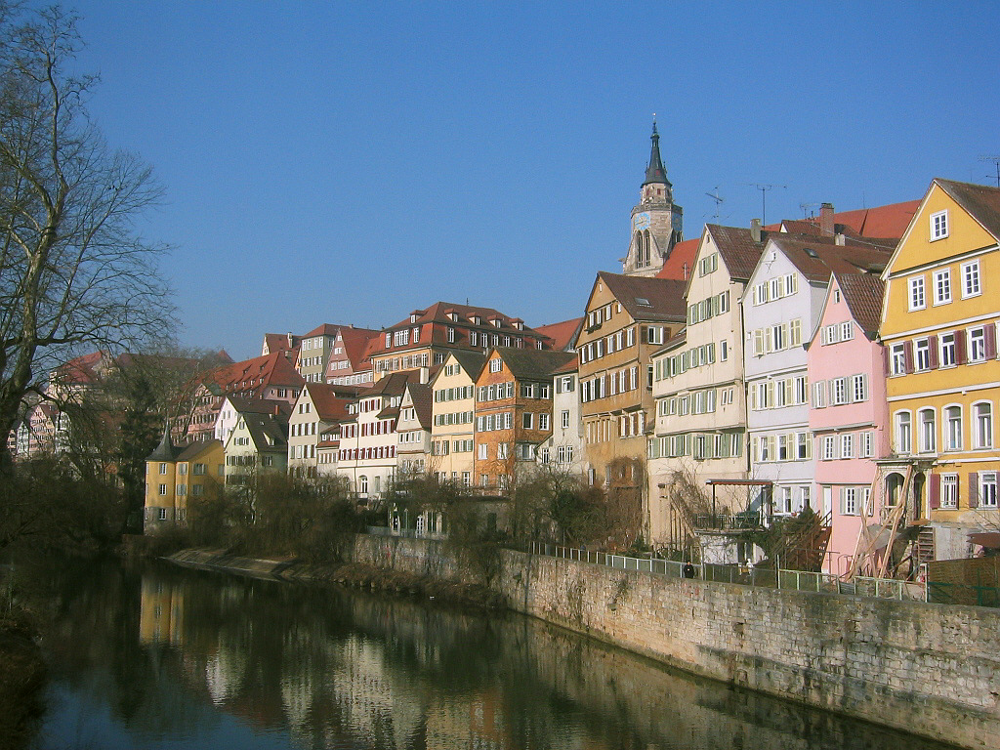

In [27]:
inverse_transform(test_transform(content_img))

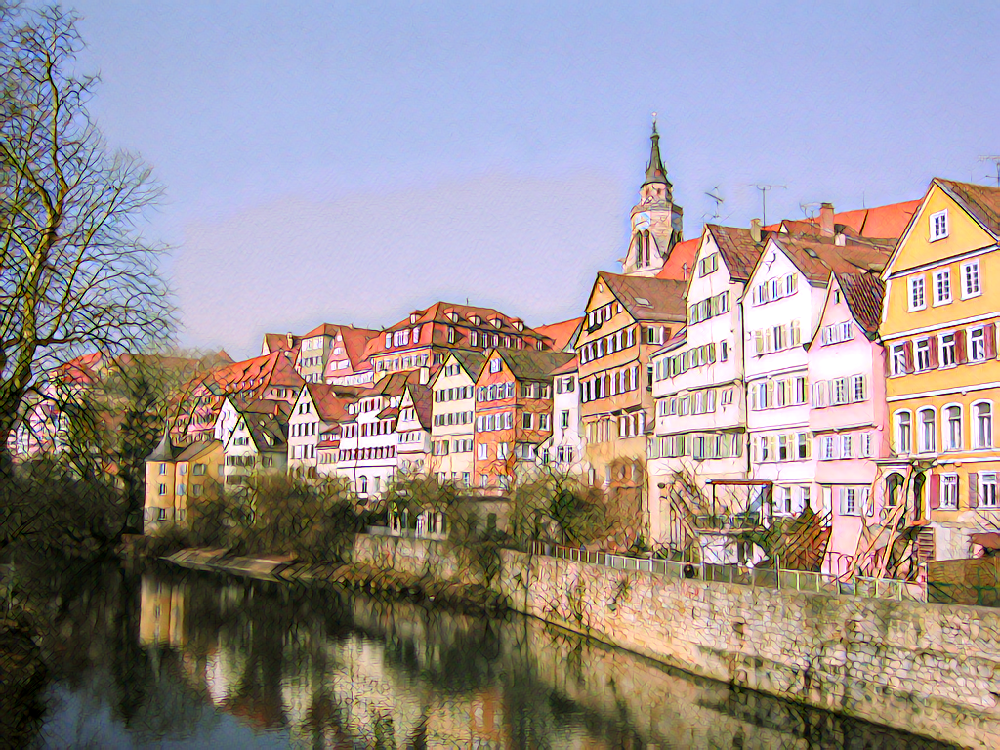

In [26]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

#############
# CODE HERE #
#############
test_img = test_transform(content_img).unsqueeze(0).cuda()
# alpha = 1e0, beta = 1e4
inverse_transform(transformer(test_img)[0].data.cpu())

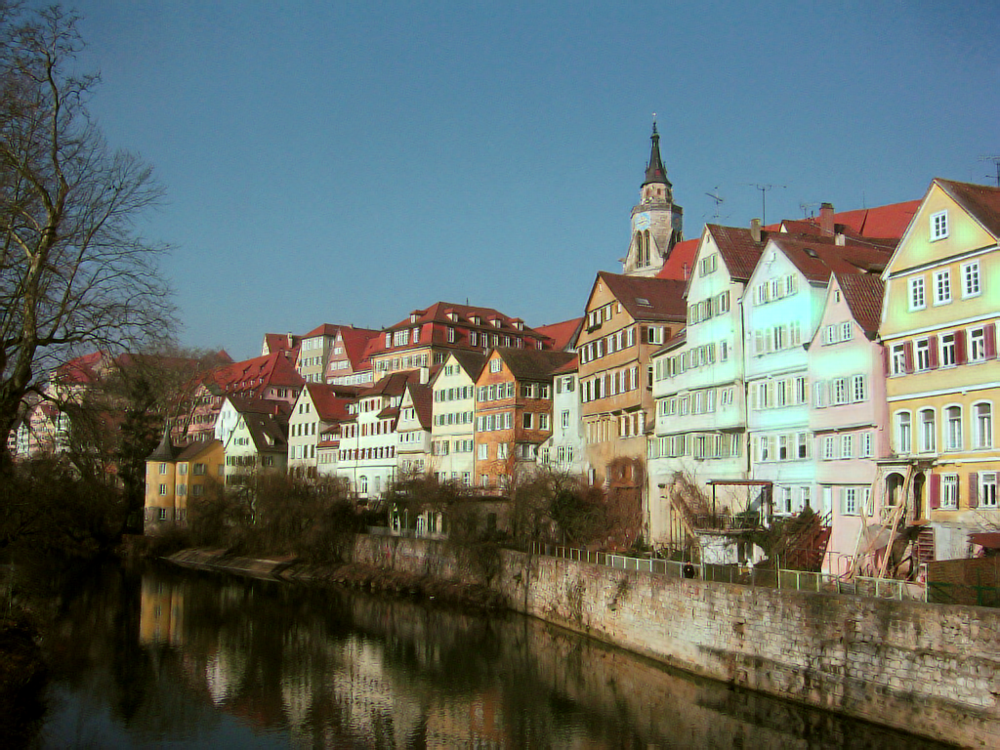

In [33]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

#############
# CODE HERE #
#############
test_img = test_transform(content_img).unsqueeze(0).cuda()
# alpha = 1e1, beta = 1e4
inverse_transform(transformer_a10(test_img)[0].data.cpu())

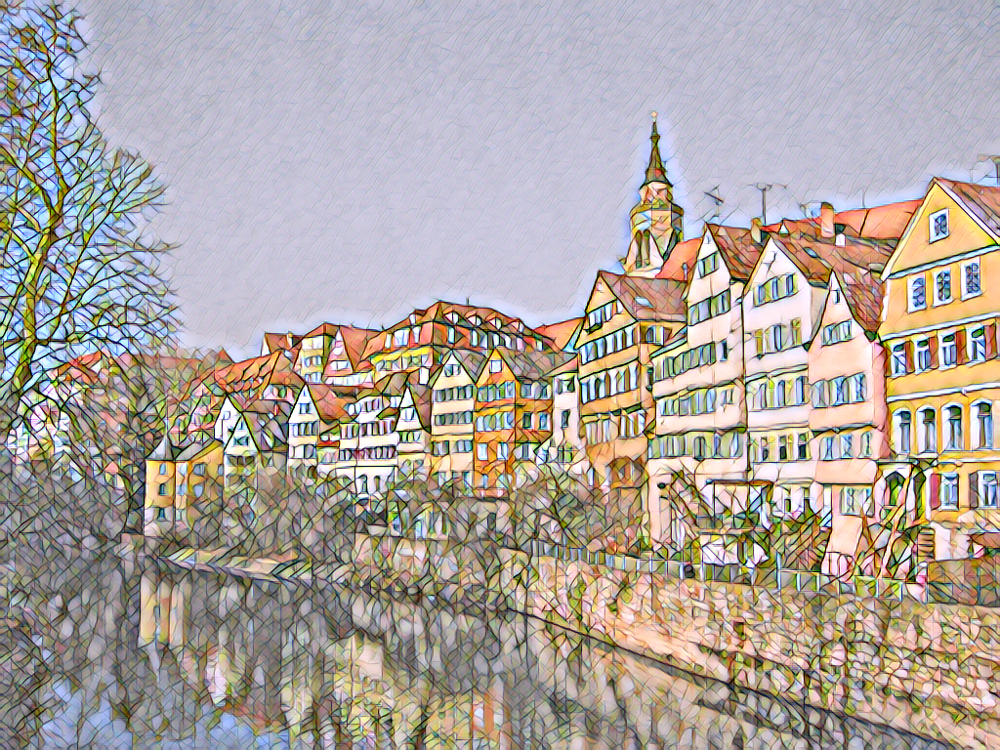

In [38]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

#############
# CODE HERE #
#############
test_img = test_transform(content_img).unsqueeze(0).cuda()
# alpha = 1e0, beta = 4*1e4
inverse_transform(transformer_b4(test_img)[0].data.cpu())

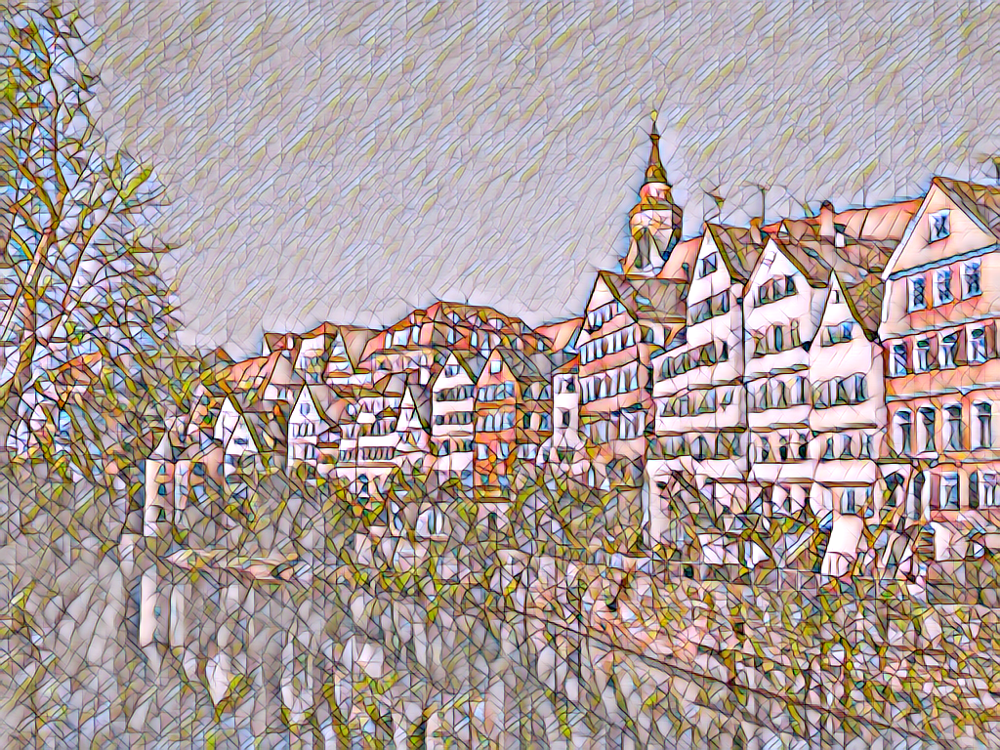

In [39]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

#############
# CODE HERE #
#############
test_img = test_transform(content_img).unsqueeze(0).cuda()
# alpha = 1e0, beta = 1e5
inverse_transform(transformer_b10(test_img)[0].data.cpu())

# Discussion
- Loss function의 가중치 alpha, beta 값을 조정해가면서 loss가 어떻게 수렴하는지, 그리고 output image가 어떻게 출력되는지를 확인하였다. 
- 우선, 주어진 가중치(alpha = 1e0, beta = 1e4, gamma = 1e-5)대로 학습을 시켰을 때, style loss, content loss 순으로 감소 폭이 컸던 반면, total variation loss는 변화가 거의 없었다. 이때 얻은 output은, content image의 모습이 변화가 적은 모습을 보이면서 그 위에 약간의 색조 변화와 style image의 디자인이 입혀진 것을 확인할 수 있었다. 
- 한편, alpha를 주어진 가중치에서 10배만큼 늘린 채로 학습을 시킨 경우, content loss의 초기값이 월등히 크게 나타났고, content loss가 loss 값 수렴의 주된 요인으로 작용했다. 반면 style loss는 감소폭이 적었고, total variation loss는 오히려 증가했다. 이때 output은 content image의 원형이 거의 그대로 유지되었고, 아주 미미한 색조 변화만을 보였다. 이를 통해 content loss의 반영 비율을 높이는 경우 image transfer model은 content 정보에 더욱 치중하여 학습하고 결과를 보여준다는 사실을 확인하였다. 
- 더 나아가, beta 값을 주어진 가중치에서 각각 4배, 10배만큼 늘린 채로 학습을 진행시켰다. 이때 초기 style loss 값은 beta 값의 크기에 비례하여 나타났으며, 이 값은 이후 학습에 따라 크게 감소하여 수렴하는 모습을 보였다. 한편, content loss와 total variation loss는 오히려 증가했다. 이때 얻은 output은 style image의 디자인이 beta가 증가함에 따라 더욱 많이 반영되는 것을 관찰할 수 있다. 여기서 style loss의 반영 비율을 높이는 경우 image transfer model은 style 정보에 더욱 가중치를 두어 학습하고 결과를 낸다는 사실을 알 수 있었다. 
- 또한, 기존의 style transfer에서 이미지 자체의 parameter를 주어진 content image와 style image에 비교하여 loss를 구하고 이를 학습시키는 것과는 달리, image transfer network를 거친 후 얻은 output에 대하여 loss를 구하고, 이에 대한 parameter들을 학습시키기 때문에 더 적은 양의 computing power를 요구하여 더욱 수렴 속도가 빠르고, 학습이 더욱 효율적으로 진행되었기에 얻게 된 output image에 더욱 정교한 style이 반영되었음을 확인할 수 있다. 

### *References*
[1] Neural Transfer Pytorch Tutorial (https://pytorch.org/tutorials/advanced/neural_style_tutorial.html)